In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import requests
import random
from faker import Faker
from datetime import datetime

In [260]:
fake = Faker()


NUM_CUSTOMERS = 500
NUM_PRODUCTS = 100
NUM_TRANSACTIONS = 3000
NUM_BROWSING_EVENTS = 5000
NUM_REVIEWS = 1000


categories = ['Dresses', 'Jeans', 'Accessories', 'T-Shirts']
brands = ['Zara', 'H&M', 'Levis',]
colors = ['Red', 'Blue', 'Black', 'White', 'Green', 'Yellow']
sizes = ['XS', 'S', 'M', 'L', 'XL']
styles = ['Casual', 'Formal', 'Sporty']
seasons = ['Spring', 'Summer', 'Autumn', 'Winter']
materials = ['Cotton', 'Denim', 'Leather', 'Polyester', 'Wool']


products = []
for i in range(1, NUM_PRODUCTS + 1):
    products.append({
        'product_id': i,
        'category': random.choice(categories),
        'brand': random.choice(brands),
        'price': round(random.uniform(10, 200), 2),
        'color': random.choice(colors),
        'size': random.choice(sizes),
        'style': random.choice(styles),
        'season': random.choice(seasons),
        'material': random.choice(materials),
        'avg_rating': round(random.uniform(2.5, 5.0), 1)
    })
products_df = pd.DataFrame(products)

city_country_map = {
    "New York": "USA",
    "Los Angeles": "USA",
    "Chicago": "USA",
    "Toronto": "Canada",
    "Vancouver": "Canada",
    "London": "UK",
    "Manchester": "UK",
    "Paris": "France",
    "Lyon": "France",
    "Berlin": "Germany",
    "Munich": "Germany",
    "Madrid": "Spain",
    "Barcelona": "Spain",
    "Rome": "Italy",
    "Milan": "Italy",
    "Amsterdam": "Netherlands",
    "Rotterdam": "Netherlands",
    "Brussels": "Belgium",
    "Zurich": "Switzerland",
    "Geneva": "Switzerland",
    "Stockholm": "Sweden",
    "Oslo": "Norway",
    "Copenhagen": "Denmark",
    "Helsinki": "Finland",
    "Vienna": "Austria",
    "Lisbon": "Portugal",
    "Dublin": "Ireland",
    "Athens": "Greece",
    "Prague": "Czech Republic",
    "Budapest": "Hungary",
    "Warsaw": "Poland",
    "Moscow": "Russia",
    "Istanbul": "Turkey",
    "Dubai": "UAE",
    "Doha": "Qatar",
    "Riyadh": "Saudi Arabia",
    "Mumbai": "India",
    "Bangalore": "India",
    "Tokyo": "Japan",
    "Osaka": "Japan",
    "Seoul": "South Korea",
    "Beijing": "China",
    "Shanghai": "China",
    "Bangkok": "Thailand",
    "Singapore": "Singapore",
    "Jakarta": "Indonesia",
    "Sydney": "Australia",
    "Melbourne": "Australia",
    "Cape Town": "South Africa",
    "Johannesburg": "South Africa"
}

cities = list(city_country_map.keys())

customers = []
for i in range(1, NUM_CUSTOMERS + 1):
    age = random.randint(18, 65)
    gender = random.choice(['Male', 'Female'])
    city = random.choice(cities)
    
    # Income based on age
    if age < 25:
        income = np.random.normal(25000, 5000)
    elif age < 35:
        income = np.random.normal(40000, 10000)
    elif age < 50:
        income = np.random.normal(60000, 15000)
    else:
        income = np.random.normal(50000, 10000)
    income = max(15000, round(income, 2))

    signup_date = fake.date_between(start_date='-2y', end_date='-1m')
    tenure_days = (datetime.now().date() - signup_date).days

    # Cart abandonment rate
    cart_abandonment_rate = round(np.clip(np.random.normal(0.3, 0.15), 0, 1), 2)
    if cart_abandonment_rate > 0.5:
        frequency = random.randint(1, 3)
        discount_usage_rate = round(random.uniform(0.5, 1.0), 2)
    else:
        frequency = random.randint(5, 20)
        discount_usage_rate = round(random.uniform(0.0, 0.5), 2)

    if frequency > 10:
        recency_days = random.randint(1, 30)
    elif frequency > 5:
        recency_days = random.randint(15, 60)
    else:
        recency_days = random.randint(30, 180)

    avg_order_value = round(random.uniform(20, 150), 2)
    monetary = round(frequency * avg_order_value, 2)

    devices = random.sample(['Mobile', 'Desktop'], k=random.randint(1, 2))
    if 'Mobile' in devices:
        cart_abandonment_rate = round(min(cart_abandonment_rate + 0.1, 1.0), 2)
    devices_used = ', '.join(devices)

    email_opens = frequency * random.randint(1, 3)
    email_clicks = int(email_opens * random.uniform(0.2, 0.6))
    email_unsubscribes = 0 if frequency > 5 else random.randint(0, 2)

    if gender == 'Female':
        preferred_categories = random.sample(['Dresses', 'Accessories'], 1)
    else:
        preferred_categories = random.sample(['Jeans', 'T-Shirts'], 1)
    favorite_brands = random.sample(brands, 2)

    customers.append({
        'customer_id': i,
        'age': age,
        'gender': gender,
        'city': city,
        'country': city_country_map[city],
        'income': income,
        'signup_date': signup_date,
        'tenure_days': tenure_days,
        'recency_days': recency_days,
        'frequency': frequency,
        'monetary': monetary,
        'favorite_brands': ', '.join(favorite_brands),
        'preferred_categories': ', '.join(preferred_categories),
        'avg_order_value': avg_order_value,
        'discount_usage_rate': discount_usage_rate,
        'cart_abandonment_rate': cart_abandonment_rate,
        'devices_used': devices_used,
        'email_opens': email_opens,
        'email_clicks': email_clicks,
        'email_unsubscribes': email_unsubscribes
    })
customers_df = pd.DataFrame(customers)

# Transactions
transactions = []
for i in range(1, NUM_TRANSACTIONS + 1):
    cust = random.choice(customers)
    prod = random.choice(products)
    transactions.append({
        'transaction_id': i,
        'customer_id': cust['customer_id'],
        'product_id': prod['product_id'],
        'timestamp': fake.date_time_between(start_date='-2y', end_date='now'),
        'quantity': random.randint(1, 3),
        'price_paid': round(prod['price'] * random.uniform(0.7, 1.0), 2)
    })
transactions_df = pd.DataFrame(transactions)

In [261]:
products_df.head()

,product_id,category,brand,price,color,size,style,season,material,avg_rating
0,1,Dresses,Levis,55.16,Green,L,Formal,Winter,Denim,3.9
1,2,Accessories,Levis,121.88,White,L,Sporty,Winter,Denim,3.1
2,3,Accessories,Zara,166.23,Green,M,Sporty,Autumn,Wool,3.4
3,4,T-Shirts,Levis,107.38,Black,S,Sporty,Winter,Denim,3.3
4,5,Accessories,H&M,96.17,White,XL,Casual,Spring,Polyester,4.7


In [262]:
customers_df.head()

,customer_id,age,gender,city,country,income,signup_date,tenure_days,recency_days,frequency,monetary,favorite_brands,preferred_categories,avg_order_value,discount_usage_rate,cart_abandonment_rate,devices_used,email_opens,email_clicks,email_unsubscribes
0,1,46,Female,Melbourne,Australia,69247.80,2024-11-10,208,11,13,1179.62,"Zara, Levis",Accessories,90.74,0.17,0.55,"Desktop, Mobile",39,16,0
1,2,46,Female,Beijing,China,48027.22,2024-12-11,177,28,11,269.72,"H&M, Levis",Dresses,24.52,0.48,0.55,"Desktop, Mobile",33,11,0
2,3,22,Male,Manchester,UK,25289.18,2024-09-23,256,2,13,1726.14,"Levis, Zara",T-Shirts,132.78,0.03,0.43,"Mobile, Desktop",39,15,0
3,4,62,Male,Jakarta,Indonesia,42593.75,2025-01-13,144,28,8,842.80,"Levis, Zara",Jeans,105.35,0.39,0.16,"Mobile, Desktop",16,7,0
4,5,32,Female,Prague,Czech Republic,49163.62,2024-04-09,423,6,19,575.32,"H&M, Levis",Accessories,30.28,0.24,0.43,Desktop,38,16,0


In [263]:
transactions_df.head()

,transaction_id,customer_id,product_id,timestamp,quantity,price_paid
0,1,420,1,2023-06-14 03:20:27,3,41.35
1,2,114,38,2024-03-24 08:13:46,2,143.73
2,3,386,57,2025-03-12 01:15:45,2,112.11
3,4,447,78,2025-03-09 20:59:03,1,54.16
4,5,450,56,2024-10-12 09:01:47,1,144.87


In [264]:
customers_ori_df = customers_df.copy()
products_df.to_csv('../Dataset/Products.csv')
transactions_df.to_csv('../Dataset/Transactions.csv')

In [265]:
print(products_df.duplicated().sum())
print(customers_df.duplicated().sum())
print(transactions_df.duplicated().sum())

0
0
0


In [266]:
print(products_df.isna().sum())
print(products_df.isna().sum())
print(products_df.isna().sum())

product_id    0
category      0
brand         0
price         0
color         0
size          0
style         0
season        0
material      0
avg_rating    0
dtype: int64
product_id    0
category      0
brand         0
price         0
color         0
size          0
style         0
season        0
material      0
avg_rating    0
dtype: int64
product_id    0
category      0
brand         0
price         0
color         0
size          0
style         0
season        0
material      0
avg_rating    0
dtype: int64


In [267]:
transactions_df['timestamp'] = pd.to_datetime(transactions_df['timestamp'])
today = pd.Timestamp('2025-05-29')

# Total amount
transactions_df['total_paid'] = transactions_df['quantity'] * transactions_df['price_paid']

# First & Last purchase
agg_times = transactions_df.groupby('customer_id')['timestamp'].agg(['min', 'max']).reset_index()
agg_times.columns = ['customer_id', 'first_purchase_date', 'last_purchase_date']
agg_times['days_since_first_purchase'] = (today - agg_times['first_purchase_date']).dt.days
agg_times['recency_days_from_txn'] = (today - agg_times['last_purchase_date']).dt.days
agg_times['last_purchase_dayofweek'] = agg_times['last_purchase_date'].dt.dayofweek

# Average days between purchases
transactions_df = transactions_df.sort_values(['customer_id', 'timestamp'])
transactions_df['days_between'] = transactions_df.groupby('customer_id')['timestamp'].diff().dt.days
avg_interval = transactions_df.groupby('customer_id')['days_between'].mean().reset_index()
avg_interval.columns = ['customer_id', 'avg_days_between_orders']

# Active days and months
transactions_df['purchase_date'] = transactions_df['timestamp'].dt.date
transactions_df['purchase_month'] = transactions_df['timestamp'].dt.to_period('M')
active_days = transactions_df.groupby('customer_id')['purchase_date'].nunique().reset_index()
active_days.columns = ['customer_id', 'active_days']

active_months = transactions_df.groupby('customer_id')['purchase_month'].nunique().reset_index()
active_months.columns = ['customer_id', 'active_months']

# Merge all features
transaction_features = agg_times \
    .merge(avg_interval, on='customer_id', how='left') \
    .merge(active_days, on='customer_id', how='left') \
    .merge(active_months, on='customer_id', how='left')

# Final merge into customers table
customers_df = customers_df.merge(transaction_features, on='customer_id', how='left')

customers_df.head()

,customer_id,age,gender,city,country,income,signup_date,tenure_days,recency_days,frequency,...,email_clicks,email_unsubscribes,first_purchase_date,last_purchase_date,days_since_first_purchase,recency_days_from_txn,last_purchase_dayofweek,avg_days_between_orders,active_days,active_months
0,1,46,Female,Melbourne,Australia,69247.80,2024-11-10,208,11,13,...,16,0,2024-01-27 08:59:43,2025-05-19 22:47:55,487.0,9.0,0.0,159.000000,4.0,4.0
1,2,46,Female,Beijing,China,48027.22,2024-12-11,177,28,11,...,11,0,2023-07-25 12:06:13,2025-02-06 05:42:33,673.0,111.0,3.0,93.333333,7.0,7.0
2,3,22,Male,Manchester,UK,25289.18,2024-09-23,256,2,13,...,15,0,2023-06-16 02:41:58,2024-09-11 13:43:25,712.0,259.0,2.0,75.166667,7.0,7.0
3,4,62,Male,Jakarta,Indonesia,42593.75,2025-01-13,144,28,8,...,7,0,2023-07-17 17:55:33,2025-03-14 11:20:44,681.0,75.0,4.0,151.000000,5.0,5.0
4,5,32,Female,Prague,Czech Republic,49163.62,2024-04-09,423,6,19,...,16,0,2023-10-07 23:46:24,2025-01-23 18:38:45,599.0,125.0,3.0,157.333333,4.0,4.0


In [268]:
customers_df.columns

Index(['customer_id', 'age', 'gender', 'city', 'country', 'income',
       'signup_date', 'tenure_days', 'recency_days', 'frequency', 'monetary',
       'favorite_brands', 'preferred_categories', 'avg_order_value',
       'discount_usage_rate', 'cart_abandonment_rate', 'devices_used',
       'email_opens', 'email_clicks', 'email_unsubscribes',
       'first_purchase_date', 'last_purchase_date',
       'days_since_first_purchase', 'recency_days_from_txn',
       'last_purchase_dayofweek', 'avg_days_between_orders', 'active_days',
       'active_months'],
      dtype='object')

In [269]:
customers_df.dtypes

customer_id                           int64
age                                   int64
gender                               object
city                                 object
country                              object
income                              float64
signup_date                          object
tenure_days                           int64
recency_days                          int64
frequency                             int64
monetary                            float64
favorite_brands                      object
preferred_categories                 object
avg_order_value                     float64
discount_usage_rate                 float64
cart_abandonment_rate               float64
devices_used                         object
email_opens                           int64
email_clicks                          int64
email_unsubscribes                    int64
first_purchase_date          datetime64[ns]
last_purchase_date           datetime64[ns]
days_since_first_purchase       

In [270]:
print(customers_df.gender)
print(customers_df.city)
print(customers_df.country)
print(customers_df.signup_date)
print(customers_df.preferred_categories)
print(customers_df.favorite_brands)
print(customers_df.devices_used)

0      Female
1      Female
2        Male
3        Male
4      Female
        ...  
495      Male
496    Female
497      Male
498    Female
499    Female
Name: gender, Length: 500, dtype: object
0         Melbourne
1           Beijing
2        Manchester
3           Jakarta
4            Prague
           ...     
495        Shanghai
496    Johannesburg
497          Berlin
498           Tokyo
499       Melbourne
Name: city, Length: 500, dtype: object
0           Australia
1               China
2                  UK
3           Indonesia
4      Czech Republic
            ...      
495             China
496      South Africa
497           Germany
498             Japan
499         Australia
Name: country, Length: 500, dtype: object
0      2024-11-10
1      2024-12-11
2      2024-09-23
3      2025-01-13
4      2024-04-09
          ...    
495    2025-01-27
496    2025-04-06
497    2024-05-19
498    2023-12-20
499    2024-12-06
Name: signup_date, Length: 500, dtype: object
0      Accessories

In [271]:
# Convert to datetime
customers_df['signup_date'] = pd.to_datetime(customers_df['signup_date'])

# Days since signup 
customers_df['tenure_days'] = (pd.Timestamp.today() - customers_df['signup_date']).dt.days

# Month, year of signup
customers_df['signup_month'] = customers_df['signup_date'].dt.month
customers_df['signup_year'] = customers_df['signup_date'].dt.year

customers_df

,customer_id,age,gender,city,country,income,signup_date,tenure_days,recency_days,frequency,...,first_purchase_date,last_purchase_date,days_since_first_purchase,recency_days_from_txn,last_purchase_dayofweek,avg_days_between_orders,active_days,active_months,signup_month,signup_year
0,1,46,Female,Melbourne,Australia,69247.80,2024-11-10,208,11,13,...,2024-01-27 08:59:43,2025-05-19 22:47:55,487.0,9.0,0.0,159.000000,4.0,4.0,11,2024
1,2,46,Female,Beijing,China,48027.22,2024-12-11,177,28,11,...,2023-07-25 12:06:13,2025-02-06 05:42:33,673.0,111.0,3.0,93.333333,7.0,7.0,12,2024
2,3,22,Male,Manchester,UK,25289.18,2024-09-23,256,2,13,...,2023-06-16 02:41:58,2024-09-11 13:43:25,712.0,259.0,2.0,75.166667,7.0,7.0,9,2024
3,4,62,Male,Jakarta,Indonesia,42593.75,2025-01-13,144,28,8,...,2023-07-17 17:55:33,2025-03-14 11:20:44,681.0,75.0,4.0,151.000000,5.0,5.0,1,2025
4,5,32,Female,Prague,Czech Republic,49163.62,2024-04-09,423,6,19,...,2023-10-07 23:46:24,2025-01-23 18:38:45,599.0,125.0,3.0,157.333333,4.0,4.0,4,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,496,18,Male,Shanghai,China,28050.70,2025-01-27,130,45,7,...,2023-08-09 22:04:31,2024-10-22 06:20:29,658.0,218.0,1.0,87.200000,6.0,5.0,1,2025
496,497,42,Female,Johannesburg,South Africa,55929.96,2025-04-06,61,61,5,...,2023-07-14 01:41:22,2025-05-07 15:04:39,684.0,21.0,2.0,165.250000,5.0,5.0,4,2025
497,498,45,Male,Berlin,Germany,34513.18,2024-05-19,383,8,15,...,2023-10-16 23:59:56,2025-01-04 07:16:55,590.0,144.0,5.0,148.000000,4.0,4.0,5,2024
498,499,53,Female,Tokyo,Japan,41053.49,2023-12-20,534,58,10,...,2023-10-23 23:52:59,2025-01-02 02:54:21,583.0,146.0,3.0,47.888889,10.0,7.0,12,2023


In [272]:
customers_df.city.nunique()

50

In [273]:
from dotenv import load_dotenv

load_dotenv(dotenv_path="../.env")
api_key = os.getenv('api_key')



In [274]:
import time  

# Function to get lat/lon from city and country
def get_coordinates(city, country):
    query = f"{city}, {country}"
    url = f"https://api.opencagedata.com/geocode/v1/json?q={query}&key={api_key}"

    try:
        response = requests.get(url)
        response.raise_for_status()
        results = response.json()['results']
        if results:
            lat = results[0]['geometry']['lat']
            lon = results[0]['geometry']['lng']
            return lat, lon
        else:
            return None, None
    except Exception as e:
        print(f"Error fetching {city}, {country}: {e}")
        return None, None

# Create mapping for unique city-country pairs
unique_locations = customers_df[['city', 'country']].drop_duplicates()
location_to_coords = {}

for _, row in unique_locations.iterrows():
    city = row['city']
    country = row['country']
    lat, lon = get_coordinates(city, country)
    location_to_coords[(city, country)] = (lat, lon)
    print(f"{city}, {country} → ({lat}, {lon})")
    time.sleep(1)  

# Map latitude and longitude to each customer row
customers_df['latitude'] = customers_df.apply(lambda row: location_to_coords.get((row['city'], row['country']), (None, None))[0], axis=1)
customers_df['longitude'] = customers_df.apply(lambda row: location_to_coords.get((row['city'], row['country']), (None, None))[1], axis=1)

customers_df[['latitude', 'longitude']].to_csv("../Dataset/coordinates_only.csv", index=False)



Melbourne, Australia → (-37.8142454, 144.9631732)
Beijing, China → (40.190632, 116.412144)
Manchester, UK → (53.4794892, -2.2451148)
Jakarta, Indonesia → (-6.1754049, 106.827168)
Prague, Czech Republic → (50.0596288, 14.4464593)
Shanghai, China → (31.2312707, 121.4700152)
New York, USA → (40.7127281, -74.0060152)
Los Angeles, USA → (34.0536909, -118.242766)
Mumbai, India → (19.054999, 72.8692035)
Lyon, France → (45.7578137, 4.8320114)
Budapest, Hungary → (47.4813896, 19.1460941)
Zurich, Switzerland → (47.3744489, 8.5410422)
Lisbon, Portugal → (38.7077507, -9.1365919)
Seoul, South Korea → (37.5666791, 126.9782914)
Helsinki, Finland → (60.1674881, 24.9427473)
Rome, Italy → (41.8933203, 12.4829321)
Sydney, Australia → (-33.8698439, 151.2082848)
Istanbul, Turkey → (41.006381, 28.9758715)
Rotterdam, Netherlands → (51.9244424, 4.47775)
Madrid, Spain → (40.4167047, -3.7035825)
Chicago, USA → (41.8755616, -87.6244212)
Vienna, Austria → (48.2083537, 16.3725042)
Johannesburg, South Africa → (-26

In [275]:
coords_df = pd.read_csv("../Dataset/coordinates_only.csv")
customers_df['latitude'] = coords_df['latitude']
customers_df['longitude'] = coords_df['longitude']


In [276]:
print(customers_df[['customer_id', 'city', 'country', 'latitude', 'longitude']].head())

   customer_id        city         country   latitude   longitude
0            1   Melbourne       Australia -37.814245  144.963173
1            2     Beijing           China  40.190632  116.412144
2            3  Manchester              UK  53.479489   -2.245115
3            4     Jakarta       Indonesia  -6.175405  106.827168
4            5      Prague  Czech Republic  50.059629   14.446459


In [277]:
customers_df.drop(columns=['city','country'] , axis=1 , inplace=True)
customers_df.head()

,customer_id,age,gender,income,signup_date,tenure_days,recency_days,frequency,monetary,favorite_brands,...,days_since_first_purchase,recency_days_from_txn,last_purchase_dayofweek,avg_days_between_orders,active_days,active_months,signup_month,signup_year,latitude,longitude
0,1,46,Female,69247.80,2024-11-10,208,11,13,1179.62,"Zara, Levis",...,487.0,9.0,0.0,159.000000,4.0,4.0,11,2024,-37.814245,144.963173
1,2,46,Female,48027.22,2024-12-11,177,28,11,269.72,"H&M, Levis",...,673.0,111.0,3.0,93.333333,7.0,7.0,12,2024,40.190632,116.412144
2,3,22,Male,25289.18,2024-09-23,256,2,13,1726.14,"Levis, Zara",...,712.0,259.0,2.0,75.166667,7.0,7.0,9,2024,53.479489,-2.245115
3,4,62,Male,42593.75,2025-01-13,144,28,8,842.80,"Levis, Zara",...,681.0,75.0,4.0,151.000000,5.0,5.0,1,2025,-6.175405,106.827168
4,5,32,Female,49163.62,2024-04-09,423,6,19,575.32,"H&M, Levis",...,599.0,125.0,3.0,157.333333,4.0,4.0,4,2024,50.059629,14.446459


In [278]:
from sklearn.cluster import DBSCAN

coords = np.radians(customers_df[['latitude', 'longitude']])

db = DBSCAN(eps=0.05, min_samples=5, metric='haversine').fit(coords)

customers_df['cluster'] = db.labels_


In [279]:
customers_df['cluster'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, -1, 28, 29, 30, 31, 32])

In [280]:
customers_df['gender_encoded'] = customers_df['gender'].map({
    'Male': 0,
    'Female': 1
})

customers_df.drop('gender',axis=1,inplace=True)
customers_df.head()

,customer_id,age,income,signup_date,tenure_days,recency_days,frequency,monetary,favorite_brands,preferred_categories,...,last_purchase_dayofweek,avg_days_between_orders,active_days,active_months,signup_month,signup_year,latitude,longitude,cluster,gender_encoded
0,1,46,69247.80,2024-11-10,208,11,13,1179.62,"Zara, Levis",Accessories,...,0.0,159.000000,4.0,4.0,11,2024,-37.814245,144.963173,0,1
1,2,46,48027.22,2024-12-11,177,28,11,269.72,"H&M, Levis",Dresses,...,3.0,93.333333,7.0,7.0,12,2024,40.190632,116.412144,1,1
2,3,22,25289.18,2024-09-23,256,2,13,1726.14,"Levis, Zara",T-Shirts,...,2.0,75.166667,7.0,7.0,9,2024,53.479489,-2.245115,2,0
3,4,62,42593.75,2025-01-13,144,28,8,842.80,"Levis, Zara",Jeans,...,4.0,151.000000,5.0,5.0,1,2025,-6.175405,106.827168,3,0
4,5,32,49163.62,2024-04-09,423,6,19,575.32,"H&M, Levis",Accessories,...,3.0,157.333333,4.0,4.0,4,2024,50.059629,14.446459,4,1


In [281]:
customers_df['device_encoded'] = customers_df['devices_used'].map({
    'Mobile': 0,
    'Desktop': 1
})

customers_df.drop('devices_used',axis=1,inplace=True)
customers_df.head()

,customer_id,age,income,signup_date,tenure_days,recency_days,frequency,monetary,favorite_brands,preferred_categories,...,avg_days_between_orders,active_days,active_months,signup_month,signup_year,latitude,longitude,cluster,gender_encoded,device_encoded
0,1,46,69247.80,2024-11-10,208,11,13,1179.62,"Zara, Levis",Accessories,...,159.000000,4.0,4.0,11,2024,-37.814245,144.963173,0,1,NaN
1,2,46,48027.22,2024-12-11,177,28,11,269.72,"H&M, Levis",Dresses,...,93.333333,7.0,7.0,12,2024,40.190632,116.412144,1,1,NaN
2,3,22,25289.18,2024-09-23,256,2,13,1726.14,"Levis, Zara",T-Shirts,...,75.166667,7.0,7.0,9,2024,53.479489,-2.245115,2,0,NaN
3,4,62,42593.75,2025-01-13,144,28,8,842.80,"Levis, Zara",Jeans,...,151.000000,5.0,5.0,1,2025,-6.175405,106.827168,3,0,NaN
4,5,32,49163.62,2024-04-09,423,6,19,575.32,"H&M, Levis",Accessories,...,157.333333,4.0,4.0,4,2024,50.059629,14.446459,4,1,1.0


In [282]:
from sklearn.preprocessing import MultiLabelBinarizer

customers_df['preferred_categories_list'] = customers_df['preferred_categories'].apply(
    lambda x: [brand.strip() for brand in x.split(',')])
customers_df['favorite_brands_list'] = customers_df['favorite_brands'].apply(
    lambda x: [brand.strip() for brand in x.split(',')])

mlb_cat = MultiLabelBinarizer()
category_encoded = mlb_cat.fit_transform(customers_df['preferred_categories_list'])

mlb_brand = MultiLabelBinarizer()
brand_encoded = mlb_brand.fit_transform(customers_df['favorite_brands_list'])

category_df = pd.DataFrame(category_encoded , columns=mlb_cat.classes_)
brand_df = pd.DataFrame(brand_encoded, columns=mlb_brand.classes_)
customers_df = pd.concat([customers_df.reset_index(drop=True),brand_df.reset_index(drop=True),category_df.reset_index(drop=True)],axis=1)

customers_df.head()

,customer_id,age,income,signup_date,tenure_days,recency_days,frequency,monetary,favorite_brands,preferred_categories,...,device_encoded,preferred_categories_list,favorite_brands_list,H&M,Levis,Zara,Accessories,Dresses,Jeans,T-Shirts
0,1,46,69247.80,2024-11-10,208,11,13,1179.62,"Zara, Levis",Accessories,...,NaN,[Accessories],"[Zara, Levis]",0,1,1,1,0,0,0
1,2,46,48027.22,2024-12-11,177,28,11,269.72,"H&M, Levis",Dresses,...,NaN,[Dresses],"[H&M, Levis]",1,1,0,0,1,0,0
2,3,22,25289.18,2024-09-23,256,2,13,1726.14,"Levis, Zara",T-Shirts,...,NaN,[T-Shirts],"[Levis, Zara]",0,1,1,0,0,0,1
3,4,62,42593.75,2025-01-13,144,28,8,842.80,"Levis, Zara",Jeans,...,NaN,[Jeans],"[Levis, Zara]",0,1,1,0,0,1,0
4,5,32,49163.62,2024-04-09,423,6,19,575.32,"H&M, Levis",Accessories,...,1.0,[Accessories],"[H&M, Levis]",1,1,0,1,0,0,0


In [283]:
customers_df['email_engagement_score'] = (
    customers_df['email_opens'] +
    customers_df['email_clicks'] -
    customers_df['email_unsubscribes']
)

customers_df.drop(['email_opens', 'email_clicks', 'email_unsubscribes'], axis=1, inplace=True)


In [284]:
final_customers_df = customers_df.drop(columns=['signup_year','avg_order_value','recency_days_from_txn','active_months','signup_date','first_purchase_date','last_purchase_date','signup_month','latitude','longitude','favorite_brands','preferred_categories','preferred_categories_list','favorite_brands_list']
                  ,axis=1)

In [285]:
final_customers_df.head()

,customer_id,age,income,tenure_days,recency_days,frequency,monetary,discount_usage_rate,cart_abandonment_rate,days_since_first_purchase,...,gender_encoded,device_encoded,H&M,Levis,Zara,Accessories,Dresses,Jeans,T-Shirts,email_engagement_score
0,1,46,69247.80,208,11,13,1179.62,0.17,0.55,487.0,...,1,NaN,0,1,1,1,0,0,0,55
1,2,46,48027.22,177,28,11,269.72,0.48,0.55,673.0,...,1,NaN,1,1,0,0,1,0,0,44
2,3,22,25289.18,256,2,13,1726.14,0.03,0.43,712.0,...,0,NaN,0,1,1,0,0,0,1,54
3,4,62,42593.75,144,28,8,842.80,0.39,0.16,681.0,...,0,NaN,0,1,1,0,0,1,0,23
4,5,32,49163.62,423,6,19,575.32,0.24,0.43,599.0,...,1,1.0,1,1,0,1,0,0,0,54


In [286]:
print(type(customers_df))

<class 'pandas.core.frame.DataFrame'>


In [287]:
final_customers_df.dtypes

customer_id                    int64
age                            int64
income                       float64
tenure_days                    int64
recency_days                   int64
frequency                      int64
monetary                     float64
discount_usage_rate          float64
cart_abandonment_rate        float64
days_since_first_purchase    float64
last_purchase_dayofweek      float64
avg_days_between_orders      float64
active_days                  float64
cluster                        int64
gender_encoded                 int64
device_encoded               float64
H&M                            int64
Levis                          int64
Zara                           int64
Accessories                    int64
Dresses                        int64
Jeans                          int64
T-Shirts                       int64
email_engagement_score         int64
dtype: object

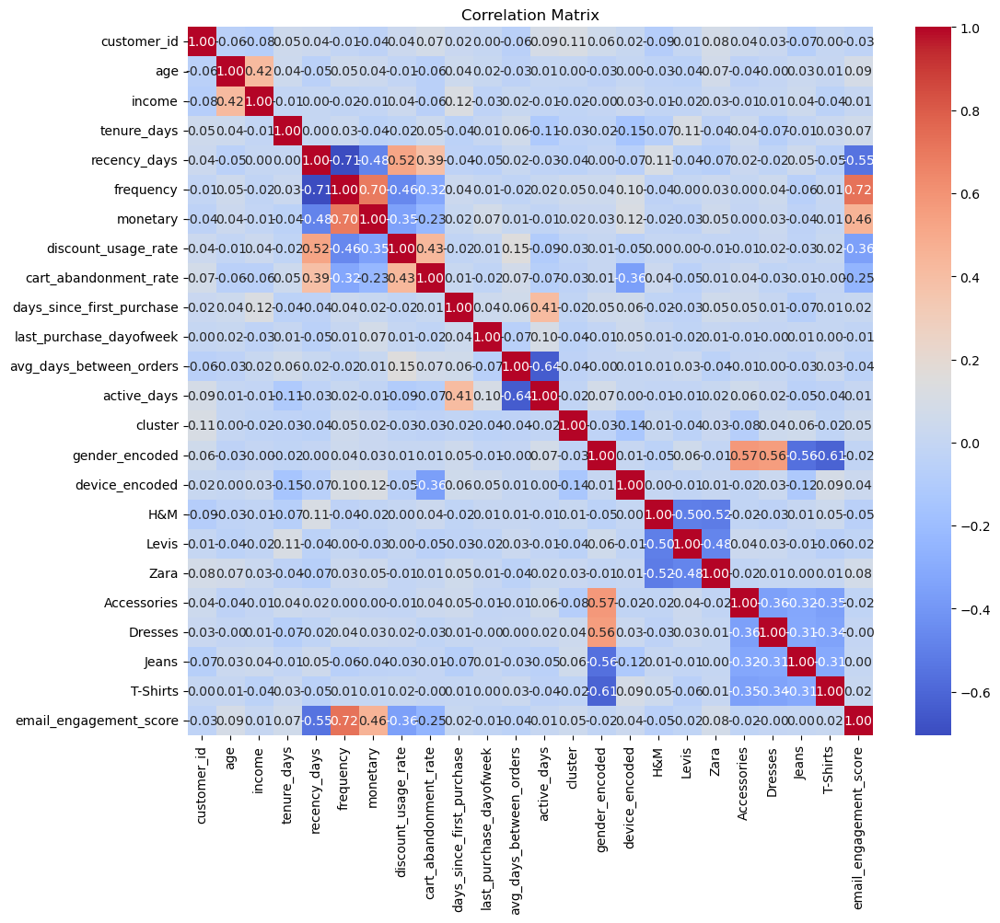

In [288]:
corr_matrix = final_customers_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix")
plt.show()

In [289]:
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler


selector = VarianceThreshold(threshold=0.05) 
final_customers = selector.fit_transform(final_customers_df)


imp = SimpleImputer(strategy='mean')

final_df = imp.fit_transform(final_customers)

scaled_df = StandardScaler().fit_transform(final_df)

In [290]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)
df = pca.fit_transform(scaled_df)

Data = pd.DataFrame(df)

Data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1.340348,1.099866,-1.578641,-1.494530,-0.762779,1.209421,-1.492499,-0.517801,-1.300710,-0.349361,-2.027395,-1.368698,-0.371957,0.315104,0.527961,-0.445998
1,-0.016583,1.421748,-0.069051,1.207506,-0.118982,1.459286,1.249202,1.723948,-1.063748,0.224592,-0.155343,-1.468525,0.014042,0.090857,-0.525576,-1.256846
2,1.781443,-1.429553,0.585375,-0.242953,1.821944,-1.184275,-0.832293,0.949979,-1.606251,-0.398433,-0.378306,-2.402093,-0.400034,-0.288843,0.013454,0.328121
3,-0.408860,-1.483311,0.172812,-1.898289,-0.475201,1.230534,0.429688,-0.190812,-2.456409,-0.240093,0.399765,-0.723356,-0.736044,0.154599,-1.495315,0.003428
4,1.325617,1.093982,-1.923577,1.407692,0.637602,1.619417,-1.328784,-0.148131,-1.363641,-0.169605,-0.338195,-0.216695,0.274094,-1.091851,0.267998,-1.385628


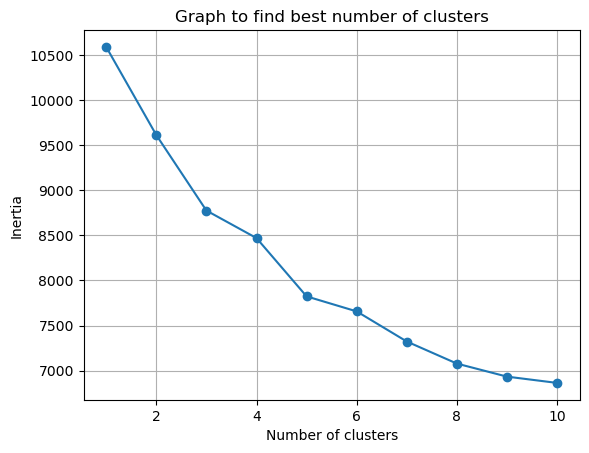

In [291]:
from sklearn.cluster import KMeans

inertia = []

for k in range(1,11):
    kmeans = KMeans(n_clusters = k , random_state = 42)
    kmeans.fit(Data)
    inertia.append(kmeans.inertia_)

plt.plot(range(1,11), inertia , marker ='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Graph to find best number of clusters')
plt.grid()
plt.show()

In [293]:
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(Data)

# Get cluster labels
labels = kmeans.labels_
customers_ori_df['Cluster'] = labels

In [295]:
customers_ori_df.head()

,customer_id,age,gender,city,country,income,signup_date,tenure_days,recency_days,frequency,...,favorite_brands,preferred_categories,avg_order_value,discount_usage_rate,cart_abandonment_rate,devices_used,email_opens,email_clicks,email_unsubscribes,Cluster
0,1,46,Female,Melbourne,Australia,69247.80,2024-11-10,208,11,13,...,"Zara, Levis",Accessories,90.74,0.17,0.55,"Desktop, Mobile",39,16,0,1
1,2,46,Female,Beijing,China,48027.22,2024-12-11,177,28,11,...,"H&M, Levis",Dresses,24.52,0.48,0.55,"Desktop, Mobile",33,11,0,0
2,3,22,Male,Manchester,UK,25289.18,2024-09-23,256,2,13,...,"Levis, Zara",T-Shirts,132.78,0.03,0.43,"Mobile, Desktop",39,15,0,2
3,4,62,Male,Jakarta,Indonesia,42593.75,2025-01-13,144,28,8,...,"Levis, Zara",Jeans,105.35,0.39,0.16,"Mobile, Desktop",16,7,0,4
4,5,32,Female,Prague,Czech Republic,49163.62,2024-04-09,423,6,19,...,"H&M, Levis",Accessories,30.28,0.24,0.43,Desktop,38,16,0,0


In [297]:
customers_ori_df.to_csv('../Dataset/Customers.csv')

In [298]:
Data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,1.340348,1.099866,-1.578641,-1.494530,-0.762779,1.209421,-1.492499,-0.517801,-1.300710,-0.349361,-2.027395,-1.368698,-0.371957,0.315104,0.527961,-0.445998
1,-0.016583,1.421748,-0.069051,1.207506,-0.118982,1.459286,1.249202,1.723948,-1.063748,0.224592,-0.155343,-1.468525,0.014042,0.090857,-0.525576,-1.256846
2,1.781443,-1.429553,0.585375,-0.242953,1.821944,-1.184275,-0.832293,0.949979,-1.606251,-0.398433,-0.378306,-2.402093,-0.400034,-0.288843,0.013454,0.328121
3,-0.408860,-1.483311,0.172812,-1.898289,-0.475201,1.230534,0.429688,-0.190812,-2.456409,-0.240093,0.399765,-0.723356,-0.736044,0.154599,-1.495315,0.003428
4,1.325617,1.093982,-1.923577,1.407692,0.637602,1.619417,-1.328784,-0.148131,-1.363641,-0.169605,-0.338195,-0.216695,0.274094,-1.091851,0.267998,-1.385628


In [301]:
Data['Cluster'] = labels

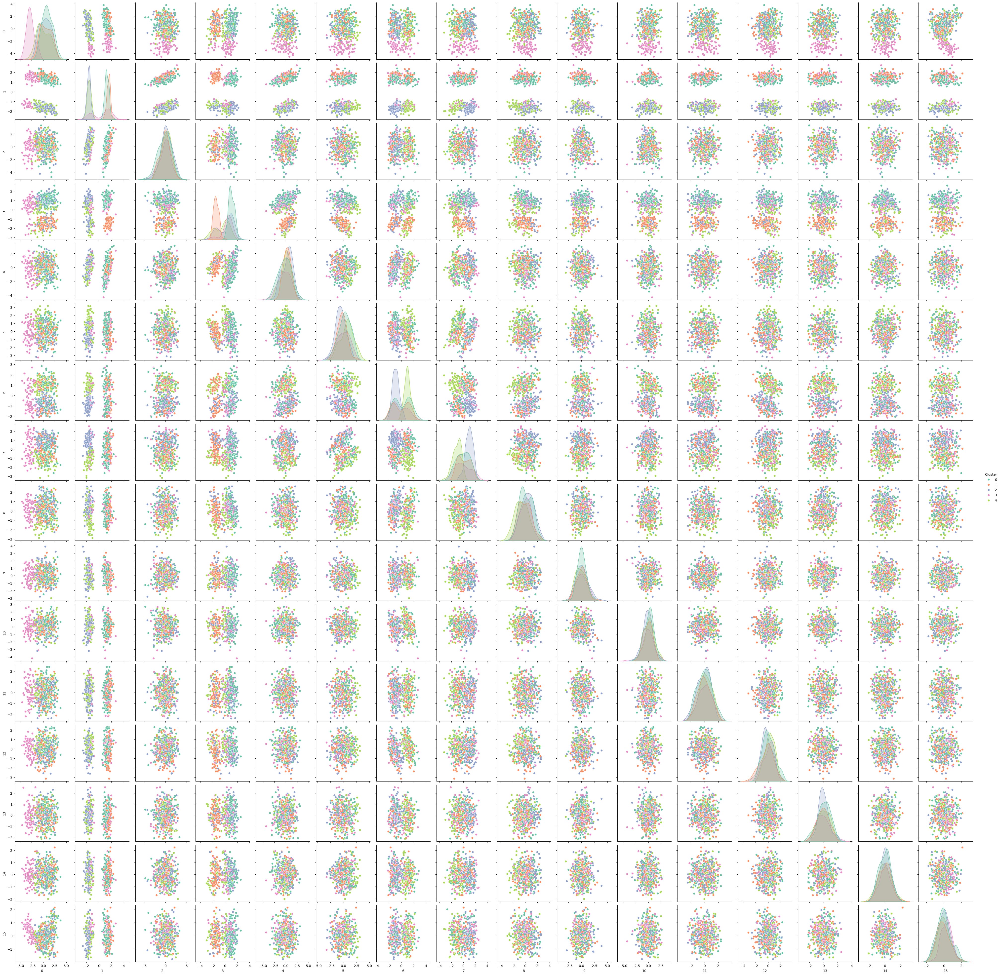

In [302]:
sns.pairplot(Data, hue='Cluster', palette='Set2')
plt.show()

In [303]:
Data['Cluster'].value_counts()

Cluster
0    120
2    112
4     97
1     91
3     80
Name: count, dtype: int64

In [304]:
Data.groupby('Cluster').mean()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
Cluster,,,,,,,,,,,,,,,,
0,0.921461,1.291833,-0.214899,1.074067,-0.200174,0.250433,0.184268,-0.055560,0.121449,0.054714,0.083163,0.006171,0.093099,0.061128,-0.003096,-0.024608
1,0.598491,1.564350,-0.045590,-1.438333,0.242971,-0.316300,-0.041266,0.086500,-0.075769,0.013040,-0.091700,-0.045162,-0.237773,-0.069635,0.035344,-0.072706
2,0.439068,-1.659771,0.217353,0.222703,0.279843,-0.550261,-0.871036,0.959508,0.383459,0.098788,-0.180226,-0.145393,-0.214050,0.025354,0.011487,-0.040631
3,-2.747518,0.514867,-0.182931,0.336580,-0.348222,-0.055791,-0.218810,-0.046581,0.033940,0.033999,-0.035108,0.064409,0.098093,-0.067390,-0.014467,0.270985
4,0.057606,-1.573926,0.208531,-0.514112,-0.016228,0.668287,0.996947,-1.081883,-0.549913,-0.222026,0.220197,0.149489,0.274141,0.016010,-0.030660,-0.077927


### Recommendation system building and validating logic

In [147]:
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import MinMaxScaler


mlb_brand = MultiLabelBinarizer()
mlb_cat = MultiLabelBinarizer()


encoded_brand = mlb_brand.fit_transform(products_df['brand'])
encoded_cat = mlb_cat.fit_transform(products_df['category'])

scaler = MinMaxScaler()
product_price = scaler.fit_transform(products_df[['price']])


product_features = np.hstack([product_price,encoded_brand,encoded_cat])                                        

In [154]:
user_txn = transactions_df.merge(products_df, on='product_id')

user_profiles = {}
for customer_id , group in user_txn.groupby('customer_id'):
    indices = products_df.index[products_df['product_id'].isin(group['product_id'])]
    user_profiles[customer_id] = product_features[indices].mean(axis=0)

user_profiles

{1: array([0.53552505, 0.16666667, 0.16666667, 0.16666667, 0.16666667,
        0.66666667, 0.66666667, 0.16666667, 0.16666667, 0.66666667,
        0.16666667, 0.16666667, 0.16666667, 0.16666667, 0.33333333,
        0.33333333, 0.16666667, 0.16666667, 0.33333333, 0.16666667,
        0.83333333, 0.16666667, 0.33333333, 0.33333333, 0.16666667,
        0.66666667, 1.        , 0.16666667]),
 2: array([0.62765149, 0.33333333, 0.33333333, 0.33333333, 0.33333333,
        0.33333333, 0.33333333, 0.33333333, 0.33333333, 0.33333333,
        0.33333333, 0.33333333, 0.16666667, 0.33333333, 0.33333333,
        0.16666667, 0.16666667, 0.16666667, 0.16666667, 0.33333333,
        0.83333333, 0.16666667, 0.5       , 0.16666667, 0.33333333,
        0.83333333, 1.        , 0.16666667]),
 3: array([0.61124071, 0.        , 0.        , 0.2       , 0.        ,
        0.8       , 0.8       , 0.2       , 0.2       , 0.8       ,
        0.2       , 0.2       , 0.2       , 0.4       , 0.2       ,
        0.2    

In [152]:
product_features

array([[0.79656052, 0.        , 0.        , ..., 1.        , 1.        ,
        0.        ],
       [0.96126512, 1.        , 1.        , ..., 1.        , 1.        ,
        0.        ],
       [0.14023762, 0.        , 0.        , ..., 0.        , 1.        ,
        0.        ],
       ...,
       [0.56425975, 0.        , 0.        , ..., 0.        , 1.        ,
        0.        ],
       [0.2410351 , 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ],
       [0.28769055, 0.        , 0.        , ..., 1.        , 1.        ,
        1.        ]], shape=(100, 28))